# Delta Hes Model
Based on these equations: 

$$\frac{dH_i}{dt} = \beta_H m_{h,i}(t-T_p) - \gamma_H H_i(t)$$

$$\frac{dm_{H,i}}{dt} = \beta_m(w_H \frac{p_H^l}{p_H^l + H_i(t-T_m)^l} + w_D \frac{<D(t-T_m)>_i^n}{p_D^n + <D(t-T_m)>_i^n}) - \gamma_m m_{H,i}(t)$$

$$\frac{dD_i}{dt} = \beta_D m_{D,i}(t-T_p) - \gamma_D D_i(t)$$

$$\frac{dm_{D,i}}{dt} = \beta_m \frac{p_H^l}{p_H^l + H_i(t-T_m)^l} - \gamma_m m_{H,i}(t)$$

Using non-dimensionalisation:
- $H_i = \tilde H h_i$ --> $\tilde H = p_H$
- $D_i = \tilde D d_i$ --> $\tilde D = p_D$
- $m_{H,i} = \tilde {m}_H m_{h,i}$ --> $\tilde m_H = \frac{\beta_m}{\gamma_m}$
- $m_{D,i} = \tilde {m}_D m_{d,i}$  --> $\tilde m_D = \frac{\beta_m}{\gamma_m}$
- $ t = \tilde t \tau$ --> $\tilde t = \gamma_m^{-1}$

and the following parameters: 
- $\alpha_H = \frac{\beta_H \beta_m}{\gamma_H \gamma_m p_H}$ 
- $\alpha_D = \frac{\beta_D \beta_m}{\gamma_D \gamma_m p_D}$
- $\mu = \frac{\gamma_H}{\gamma_m}$ 
- $\nu = \frac{\gamma_D}{\gamma_m}$

This gave me the following non-dimensionalised equations: 

$$\frac{d h_i}{d \tau} = \mu (\alpha_H m_{h,i}(\tau - \tau_p) - h_i(\tau))$$
$$\frac{dm_{h,i}}{d \tau} = w_H \frac{1}{1 + h_i(\tau-\tau_m)^l} + w_D \frac{<d(\tau-\tau_m)>_i^n}{1 + <d(\tau-\tau_m)>_i^n} - m_{h,i}(\tau)$$
$$\frac{d d_i}{d \tau} = \nu (\alpha_D m_{d,i}(\tau - \tau_p) - d_i(\tau))$$
$$\frac{dm_{d,i}}{d\tau} = \frac{1}{1 + h_i(\tau-\tau_m)^l} - m_{h,i}(\tau)$$

Note $\tau_p = \frac{T_p}{\tilde t}$ and $\tau_m = \frac{T_m}{\tilde t}$

In [1]:
# import necessary packages
import numpy as np
import matplotlib.pyplot as plt
from types import SimpleNamespace
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
#import visualisation as vis

In [2]:
def calculate_nondimensional_params(beta_H, beta_D, beta_m, gamma_H, gamma_D, gamma_m, p_H, p_D, T_p, T_m, w_H, w_D, l, n):
    """Calculates non-dimensional parameters from physical parameters."""
    return SimpleNamespace(
        alpha_H = (beta_H * beta_m) / (gamma_H * gamma_m * p_H),
        alpha_D = (beta_D * beta_m) / (gamma_D * gamma_m * p_D),
        mu = gamma_H / gamma_m,
        nu = gamma_D / gamma_m,
        tau_p = T_p * gamma_m,
        tau_m = T_m * gamma_m,
        w_H = w_H,
        w_D = w_D,
        l = l,
        n = n
    )

def get_params(beta_H, beta_D, beta_m, gamma_H, gamma_D, gamma_m, p_H, p_D, T_p, T_m, w_H, w_D, l, n, lattice, tau_grad = True, tau_grad_strength = 0.5):
    """Returns a SimpleNamespace containing model parameters calculated from physical parameters."""
    params_nondim = calculate_nondimensional_params(beta_H, beta_D, beta_m, gamma_H, gamma_D, gamma_m, p_H, p_D, T_p, T_m, w_H, w_D, l, n)
    params_nondim.tau_grad = tau_grad
    params_nondim.tau_grad_strength = tau_grad_strength
    
    if tau_grad:
        # add a gradient in tau_p due to the FGF gradient
        params_nondim.tau_p = tau_grad_strength * np.arange(0, lattice.P) + params_nondim.tau_p #assume linear gradient with offset tau_p
        params_nondim.tau_m = params_nondim.tau_m * np.ones(lattice.P) #assume no gradient in tau_m

    return params_nondim


def get_lattice(P, Q):
    lattice = SimpleNamespace()
    # get sizes of the system 
    lattice.P = P            # length of PSM + tailbud
    lattice.Q = Q            # diameter (2D so width) of PSM and tailbud, if Q = 1 then we have 1D system

    # define the weights, connectivity matrix and coupling strength between the cells 
    if lattice.Q > 1:
        lattice.w = 4*np.ones([P, Q])    # weight if each cell has 4 neighbours
        lattice.w[0, :] = 3              # weights of the edges is 3
        lattice.w[-1, :] = 3
        lattice.w[:, 0] = 3
        lattice.w[:, -1] = 3
        lattice.w[0, 0] = 2              # weights of the corners is 2
        lattice.w[-1, 0] = 2 
        lattice.w[0, -1] = 2
        lattice.w[-1, -1] = 2     

    else:
        lattice.w = 2*np.ones(P)
        lattice.w[0] = 1        # weight of first and last cell is only 1
        lattice.w[-1] = 1        

    lattice.connectivity = connectivitymatrix(lattice.P, lattice.Q)    # connectivity matrix 
    return lattice

def get_initial(lattice, params, initial_type = 'checkerboard'):
    print(lattice)
    U = np.random.uniform(0,1,[lattice.P, lattice.Q]) - 1/2      #a uniform random distribution
    epsilon = 1e-5
    sigma = 0.2
                                                        #multiplicative factor of Delta initial condition
    d0 = epsilon*(1 + sigma*U) 

    if initial_type == 'uniform':
        h0 = np.zeros([lattice.P, lattice.Q]) 

    elif initial_type == 'checkerboard':
        h0 = create_checkerboard(lattice.P, lattice.Q, val1=0, val2=params.alpha_H)
        
    m_h0 = np.zeros([lattice.P, lattice.Q])
    m_d0 = np.zeros([lattice.P, lattice.Q])

    return h0, m_h0, d0, m_d0


def connectivitymatrix(P, Q):
    '''Calculates the connectivity matrixs'''
    k = P*Q                 # number of cells 
    M = np.zeros([k,k])     # connectivity matrix

    # calculating the connectivity matrix

    for i in range(k):
        i_neighbour = findneigbours(i, P, Q)

        # check if the neighbours are within the range of the system
        for j in i_neighbour:
            if 0 <= j:
                M[i, j] = 1
    
    return M   

def findneigbours(index, P, Q):
    '''Finds neighbours of cell with index for system of P, Q cells'''
    
    # finding neighbours for line of cells
    if Q == 1:
        left = int(index - 1)
        right = int(index + 1)

        # check if the cell is on the edge of the system
        if index % P == 0:
            left = -1
        if index % P == P - 1:
            right = -1

        neighbours = [left, right]   
    # finding neighbours for 2D system of cells
    elif Q > 1: 

        left = index - 1
        right = index + 1
        up = index - P
        down = index + P

        # check if the cell is on the edge of the system
        if index % P == 0:
            left = -1
        if index % P == P - 1:
            right = -1
        if index < P:
            up = -1
        if index >= P*(Q-1):
            down = -1
        neighbours = [left, right, up, down]
                
    else: 
        print('Q should be at least 1')

    return neighbours

def hill_function_positive(x, params):
    """Non-dimensionalized Hill function with exponent l."""
    return x**params.l / (1 + x**params.l)

def hill_function_negative(x, params):
    """Non-dimensionalized Hill function with exponent n."""
    return 1 / (1 + x**params.n)

def get_delayed_value(values_array, current_index, delay_steps):
    """Retrieves the value from a past step in the simulation."""
    delayed_index = max(0, current_index - delay_steps)
    return values_array[delayed_index]

def get_delayed_value(values_array, current_index, delay_steps, lattice, params):
    """Retrieves the value from a past step in the simulation."""

    values_delayed = values_array.copy()

    if params.tau_grad:
        for p in range(lattice.P):
            delayed_index = max(0, current_index - delay_steps[p])
            values_delayed[current_index, p, :] = values_array[delayed_index, p, :]
    
    else:
        delayed_index = max(0, current_index - delay_steps)
        values_delayed[current_index] = values_array[delayed_index]

    return values_delayed

def d_neighbours(d, lattice):
    if lattice.Q == 1:
        axis = 0
    else:
        axis = 1
    #print(d.shape)
    d_neighbours = np.sum(lattice.connectivity * d.flatten() / lattice.w.flatten(), axis=axis)
    #print(d_neighbours.shape)
    d_neighbours = d_neighbours.reshape(lattice.P, lattice.Q)

    return d_neighbours

def Euler(x, dx_dt, dt):
    x_new = x + dx_dt*dt
    return x_new

def dh_dt(h, m_h_tau_p, params):
    """ODE for dh/dtau with time delay."""
    return params.mu * (params.alpha_H * m_h_tau_p - h)

def dmh_dt(h, h_tau_m, d_tau_neighbours, params, lattice):
    """ODE for dm_h/dtau with time delay."""
    return params.w_H * hill_function_negative(h_tau_m, params) + params.w_D * hill_function_positive(d_tau_neighbours, params) - h

def dd_dt(d, m_d_tau_p, params):
    """ODE for dd/dtau with time delay."""
    return params.nu * (params.alpha_D * m_d_tau_p - d)

def dmd_dt(m_h, h_tau_m, params):
    """ODE for dm_d/dtau with time delay."""
    return hill_function_negative(h_tau_m, params) - m_h


def animate_2D(data, interval=5, plot_save=False, filename='Animation_grid.gif', title = ''):
    """
    Create a 2D animation of a grid from a 3D array.
    
    Parameters:
    - data: 3D numpy array of shape (grid_size, grid_size, num_tsteps)
    - interval: Time between frames in milliseconds
    
    Returns:
    - HTML object to display in Jupyter Notebook
    """

    # transpose axis 1 and 2 of data
    data = np.transpose(data, axes = (0, 2, 1))
    # data = np.transpose(data, axes = (1, 0, 2))

    num_tsteps = data.shape[0]

    # Set up the figure and two axes for vertically stacked images
    fig, ax = plt.subplots(1, 1, figsize=(data.shape[2]/3, data.shape[1]/3 + 2), constrained_layout=True)

    # Plot the first image
    im = ax.imshow(data[0,:,:], cmap='YlOrRd', aspect='equal', vmin = np.min(data), vmax = np.max(data))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Posterior PSM --> Anterior PSM')
    ax.set_ylabel('Width of PSM')
    ax.set_title(title)
    
    # Add colorbar for the first image
    cbar1 = fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.1, pad=0.2)
    cbar1.set_label('Hes concentration')

    # Add a text annotation for timeframe
    timeframe_text = ax.text(0.05, 0.95, f'Time: 0', color='white', fontsize=12, transform=ax.transAxes, ha='left', va='top', bbox=dict(facecolor='black', alpha=0.5))

    # Update function for animation
    def update(frame):
        im.set_array(data[frame,:,:])
        timeframe_text.set_text(f'Time: {frame*interval}')  # Update timeframe text
        return [im]

    # Create the animation
    ani = FuncAnimation(
        fig, update, frames=num_tsteps, interval=interval, blit=True)
    if plot_save:
        ani.save(filename, writer='imagemagick', fps=10)
    
    # Convert animation to HTML for Jupyter Notebook
    return HTML(ani.to_jshtml())

def create_checkerboard(P, Q, val1=0, val2=5):
    """
    Create a P x Q checkerboard pattern with alternating values.
    
    Parameters:
    - P: Number of rows (height of the lattice)
    - Q: Number of columns (width of the lattice)
    - val1: Value for the first set of squares (default 0)
    - val2: Value for the alternating set of squares (default 5)
    
    Returns:
    - checkerboard: NumPy array of shape (P, Q)
    """
    checkerboard = np.zeros((P, Q))
    
    # Assign values based on checkerboard pattern
    for i in range(P):
        for j in range(Q):
            if (i + j) % 2 == 0:
                checkerboard[i, j] = val1
            else:
                checkerboard[i, j] = val2
    
    return checkerboard

def simulate(num_tsteps, dt, lattice, params, initial_type = 'checkerboard'):

    h_init, m_h_init, d_init, m_d_init = get_initial(lattice, params, initial_type)

    h = np.zeros([num_tsteps, lattice.P, lattice.Q])
    m_h = np.zeros([num_tsteps, lattice.P, lattice.Q])
    m_d = np.zeros([num_tsteps, lattice.P, lattice.Q])
    d = np.zeros([num_tsteps, lattice.P, lattice.Q])

    h[0] = h_init
    m_h[0] = m_h_init
    m_d[0] = m_d_init
    d[0] = d_init

    for i in range(int(num_tsteps-1)):
    
        params.tau_p_steps = np.round(params.tau_p / dt).astype(int)
        params.tau_m_steps = np.round(params.tau_m / dt).astype(int)

        m_h_tau_p = get_delayed_value(m_h, i, params.tau_p_steps, lattice, params)
        m_d_tau_p = get_delayed_value(m_d, i, params.tau_p_steps, lattice, params)
        h_tau_m = get_delayed_value(h, i, params.tau_m_steps, lattice, params)
        d_tau_m = get_delayed_value(d, i, params.tau_m_steps, lattice, params)
        d_tau_neighbours = d_neighbours(d_tau_m[i,:,:], lattice)

        # calculate the values of the next time step
        h[i+1,:,:] = Euler(h[i,:,:], dh_dt(h[i,:,:], m_h_tau_p[i,:,:], params), dt)
        m_h[i+1,:,:] = Euler(m_h[i,:,:], dmh_dt(m_h[i,:,:], h_tau_m[i,:,:], d_tau_neighbours, params, lattice), dt)
        d[i+1,:,:] = Euler(d[i,:,:], dd_dt(d[i,:,:], m_d_tau_p[i,:,:], params), dt)
        m_d[i+1,:,:] = Euler(m_d[i,:,:], dmd_dt(m_d[i,:,:], h_tau_m[i,:,:], params), dt)# set initial parameters of the reactions

    return h, m_h, d, m_d   



## Parameters 

### Parameters for 2D lateral inhibition

In [3]:
#set the lattice of the cells 
P = 30 
Q = 15

lattice = get_lattice(P, Q)

print(lattice)

# # set initial parameters of the reactions 
beta_H = 5
beta_D = 5
beta_m = 1
gamma_H = 1
gamma_D = 1
gamma_m = 1
p_H = 1
p_D = 1
T_p = 2
T_m = 2
tau_grad_strength = 0.5
w_H = 0.5
w_D = 0.5
l = 3
n = 3

params = get_params(beta_H, beta_D, beta_m, gamma_H, gamma_D, gamma_m, p_H, p_D, T_p, T_m, w_H, w_D, l, n, lattice, tau_grad_strength)

print(params)



namespace(P=30, Q=15, w=array([[2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3.

### Parameters for 1D with delay gradient

In [4]:
# # set initial parameters of the reactions 
# beta_H = 5
# beta_D = 5
# beta_m = 1
# gamma_H = 1
# gamma_D = 1
# gamma_m = 1
# p_H = 1
# p_D = 1
# T_p = 5
# T_m = 2
# tau_grad_strength = 0.5
# w_H = 0.1
# w_D = 0.9
# l = 3
# n = 3

# params = get_params(beta_H, beta_D, beta_m, gamma_H, gamma_D, gamma_m, p_H, p_D, T_p, T_m, w_H, w_D, l, n, lattice, tau_grad_strength)

# print(params)

# #set the lattice of the cells 
# P = 20 
# Q = 1

# lattice = get_lattice(P, Q)

## Define initial conditions --> turn into function?

## Simulation

In [4]:
num_tsteps = 7000
dt = 0.1
h, m_h, d, m_d = simulate(num_tsteps, dt, lattice, params)

namespace(P=30, Q=15, w=array([[2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 3.],
       [3.

## Results 2D

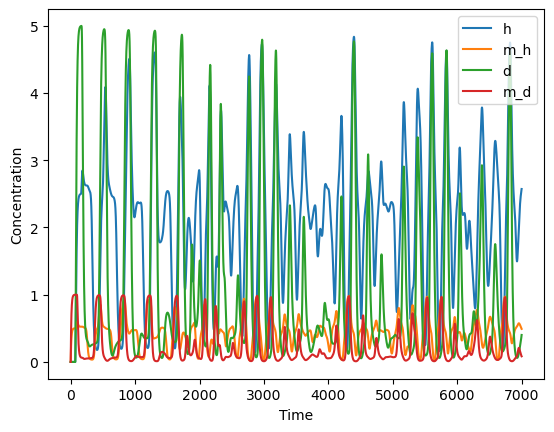

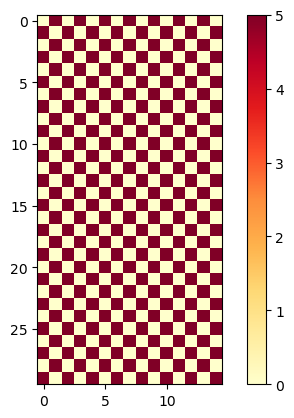

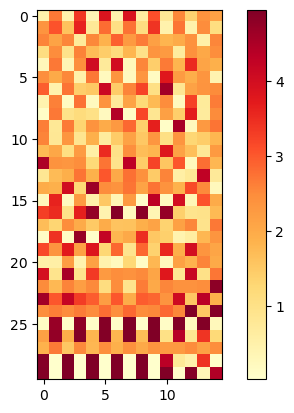

In [17]:
plt.figure()
plt.plot(h[:,10,0], label = 'h')
plt.plot(m_h[:,10,0], label = 'm_h')
plt.plot(d[:,10,0], label = 'd')
plt.plot(m_d[:,10,0], label = 'm_d')
plt.xlabel('Time')
plt.ylabel('Concentration')
plt.legend()
plt.show()


plt.figure()
plt.imshow(h[0,:,:], cmap='YlOrRd')
plt.colorbar()
plt.show()
plt.figure()
plt.imshow(h[-1,:,:], cmap='YlOrRd')
plt.colorbar()


### Relation between mRNA and protein? 


In [32]:
print(h[1,2,:], h[400,2,:].shape)
print(np.roll(h[:,2,:], -1, axis=0))

[0.  4.5 0.  4.5 0.  4.5 0.  4.5 0.  4.5 0.  4.5 0.  4.5 0. ] (15,)
[[0.         4.5        0.         ... 0.         4.5        0.        ]
 [0.         4.05       0.         ... 0.         4.05       0.        ]
 [0.         3.645      0.         ... 0.         3.645      0.        ]
 ...
 [2.5612429  2.1561759  2.54619251 ... 2.39877283 0.53209607 2.5574988 ]
 [2.56949304 2.10986692 2.54631711 ... 2.40050844 0.52858013 2.55661847]
 [0.         5.         0.         ... 0.         5.         0.        ]]


Protein delay tau_p: [ 2.   2.5  3.   3.5  4.   4.5  5.   5.5  6.   6.5  7.   7.5  8.   8.5
  9.   9.5 10.  10.5 11.  11.5 12.  12.5 13.  13.5 14.  14.5 15.  15.5
 16.  16.5] that is  [ 20  25  30  35  40  45  50  55  60  65  70  75  80  85  90  95 100 105
 110 115 120 125 130 135 140 145 150 155 160 165] steps
At lattice coordinate P = 0 tau_p: 2.0 that is  20 steps


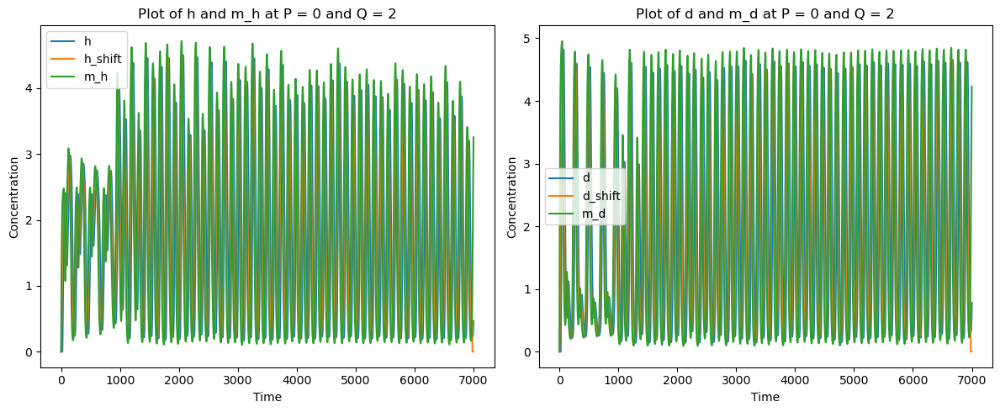

At lattice coordinate P = 1 tau_p: 2.5 that is  25 steps


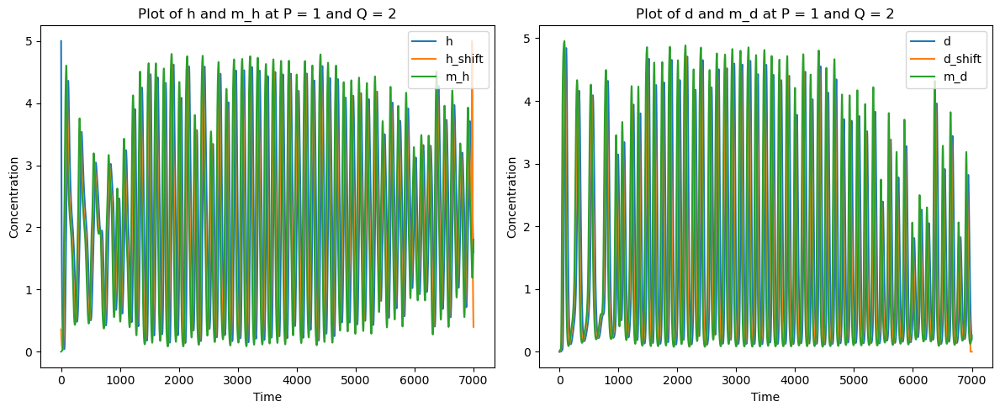

At lattice coordinate P = 2 tau_p: 3.0 that is  30 steps


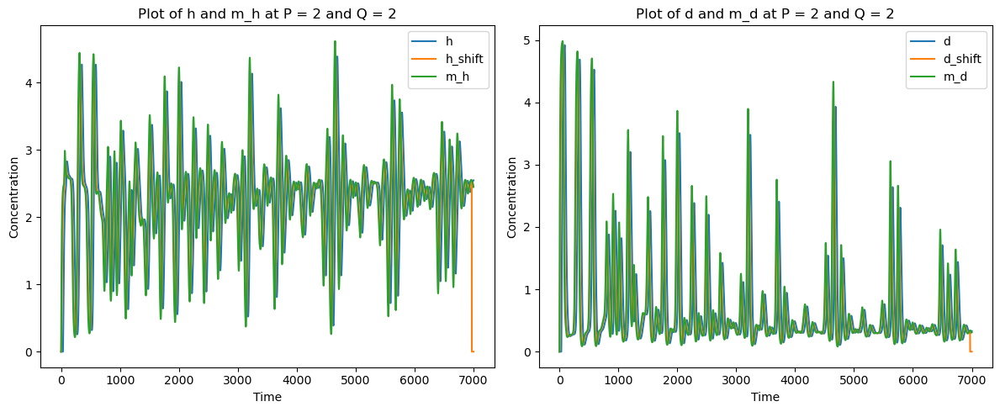

At lattice coordinate P = 3 tau_p: 3.5 that is  35 steps


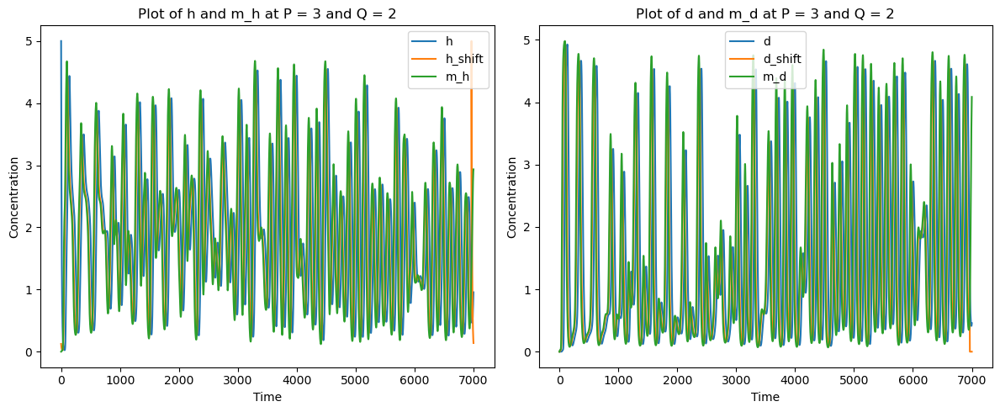

At lattice coordinate P = 4 tau_p: 4.0 that is  40 steps


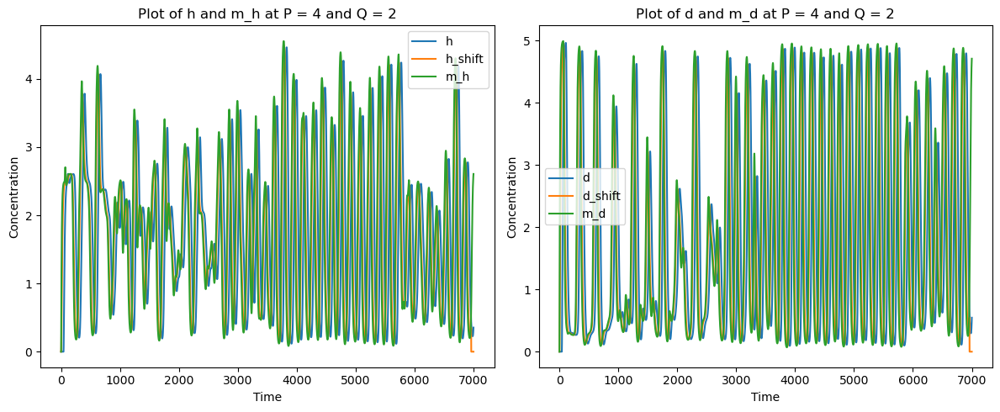

At lattice coordinate P = 5 tau_p: 4.5 that is  45 steps


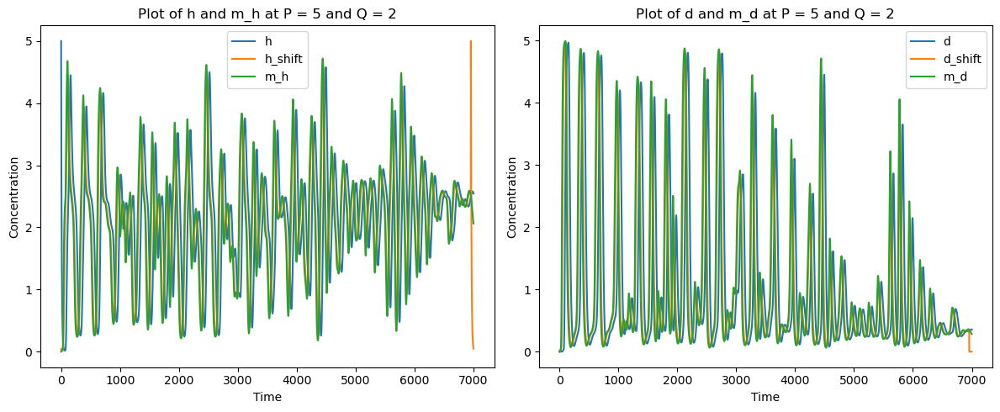

At lattice coordinate P = 6 tau_p: 5.0 that is  50 steps


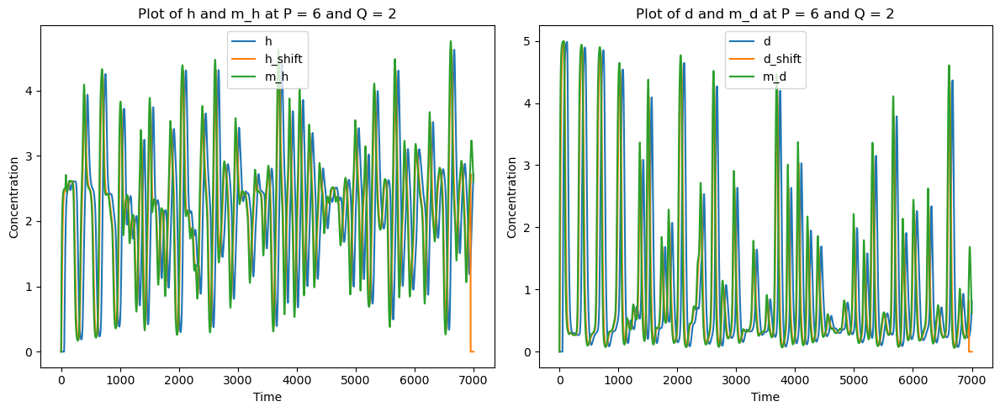

At lattice coordinate P = 7 tau_p: 5.5 that is  55 steps


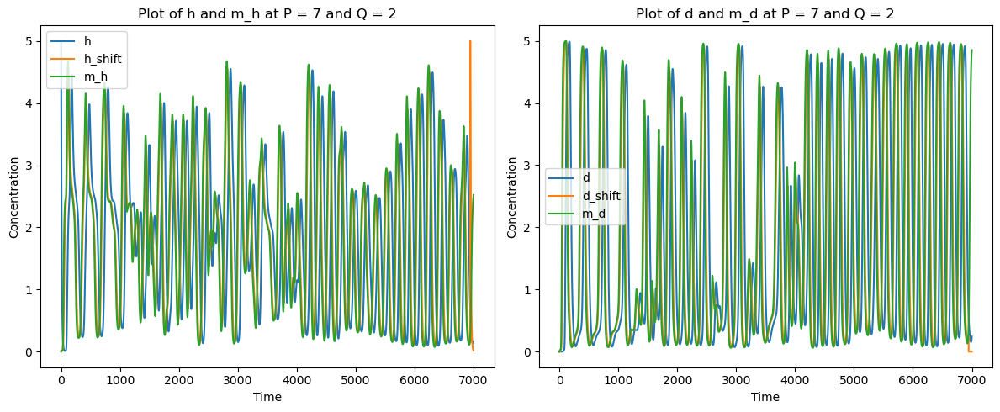

At lattice coordinate P = 8 tau_p: 6.0 that is  60 steps


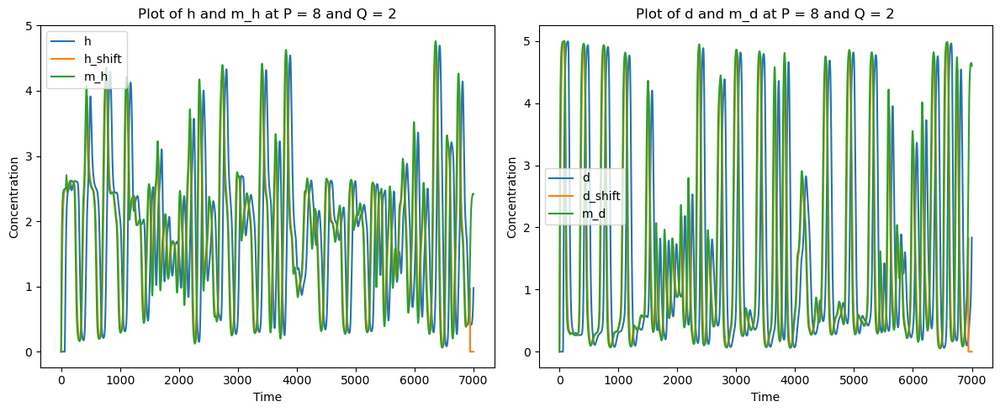

At lattice coordinate P = 9 tau_p: 6.5 that is  65 steps


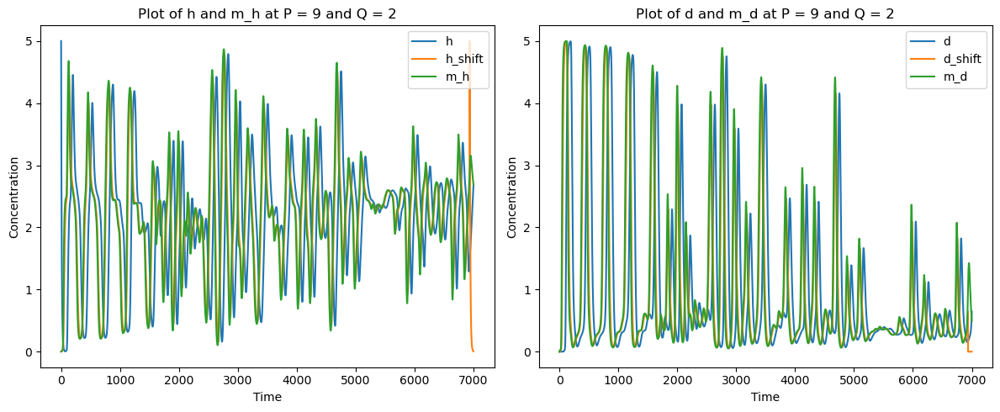

At lattice coordinate P = 10 tau_p: 7.0 that is  70 steps


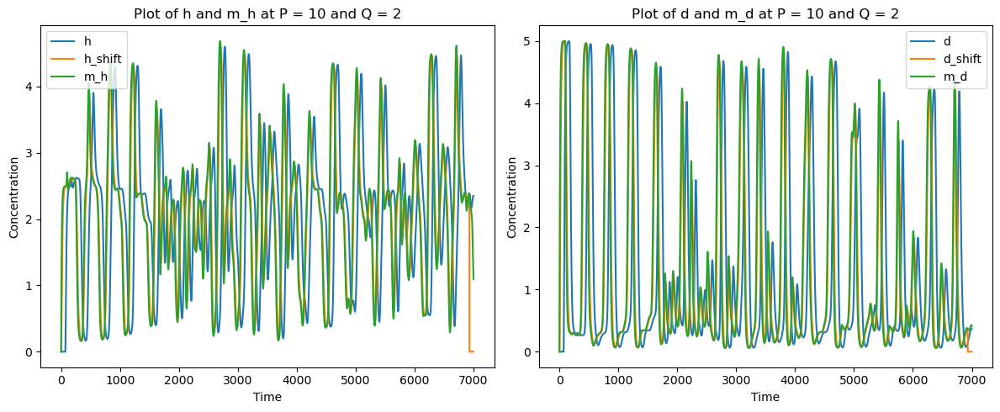

At lattice coordinate P = 11 tau_p: 7.5 that is  75 steps


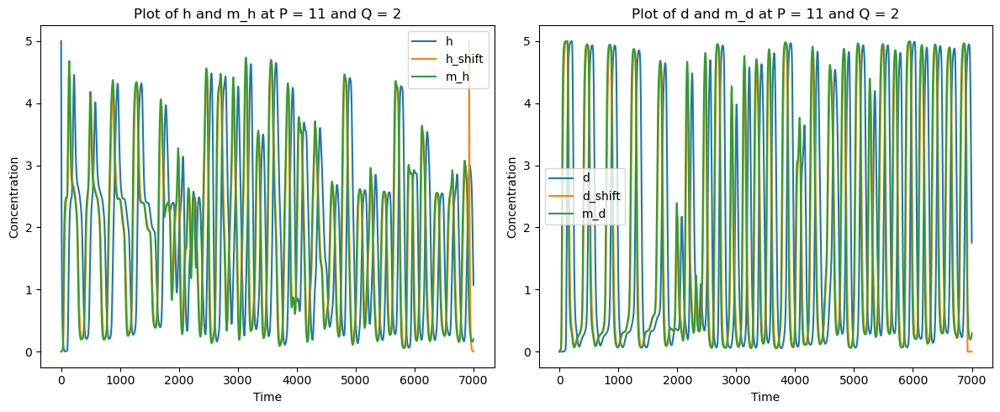

At lattice coordinate P = 12 tau_p: 8.0 that is  80 steps


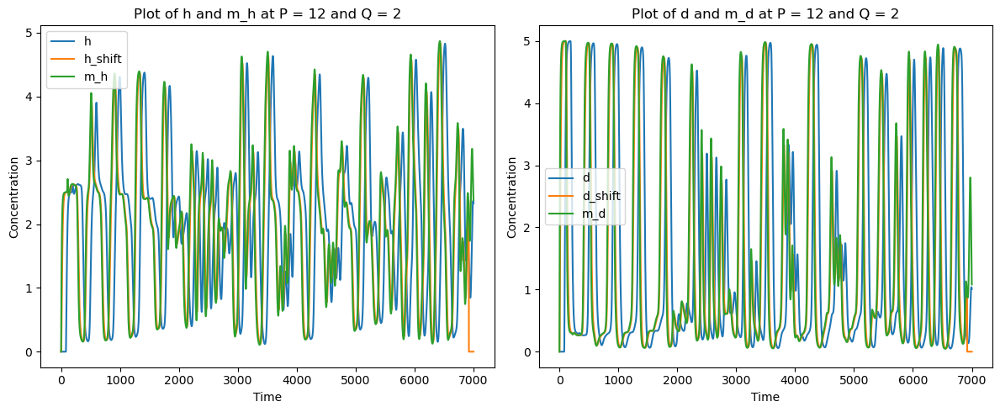

At lattice coordinate P = 13 tau_p: 8.5 that is  85 steps


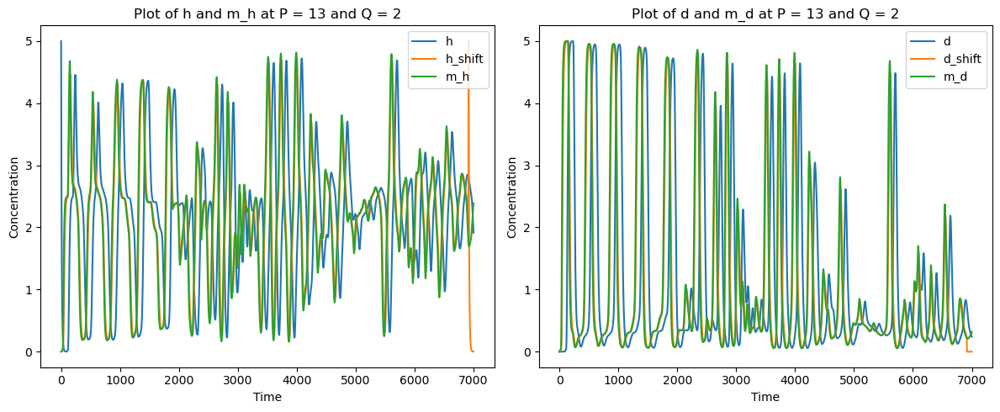

At lattice coordinate P = 14 tau_p: 9.0 that is  90 steps


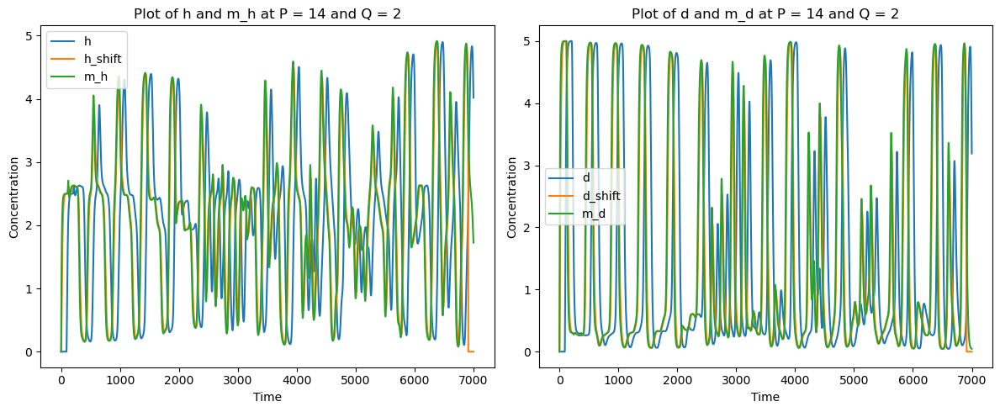

At lattice coordinate P = 15 tau_p: 9.5 that is  95 steps


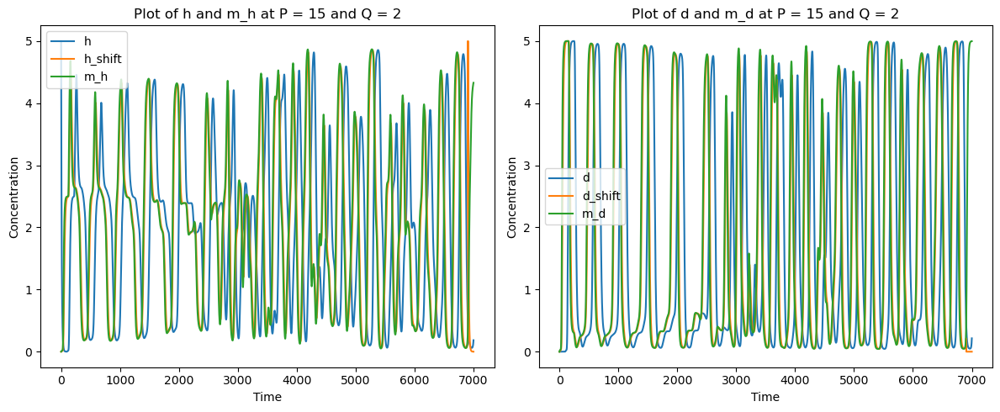

At lattice coordinate P = 16 tau_p: 10.0 that is  100 steps


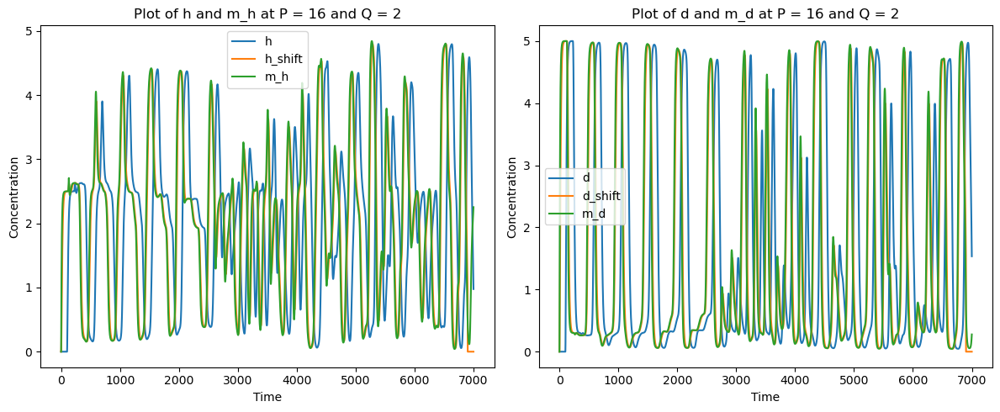

At lattice coordinate P = 17 tau_p: 10.5 that is  105 steps


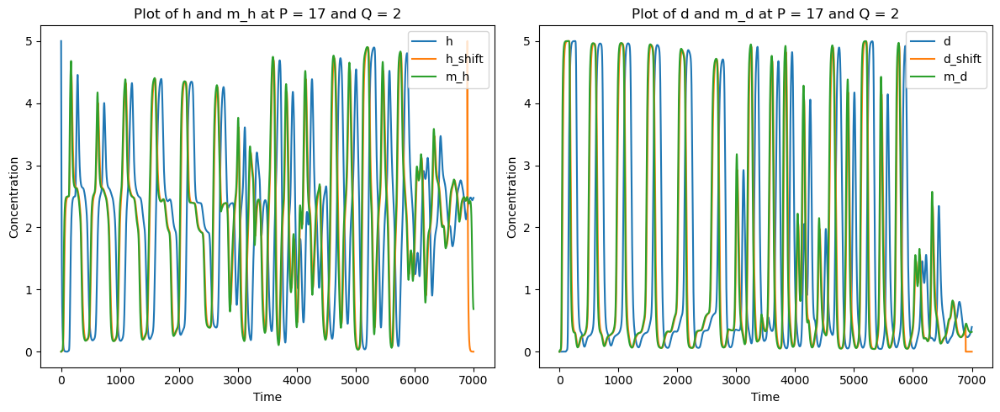

At lattice coordinate P = 18 tau_p: 11.0 that is  110 steps


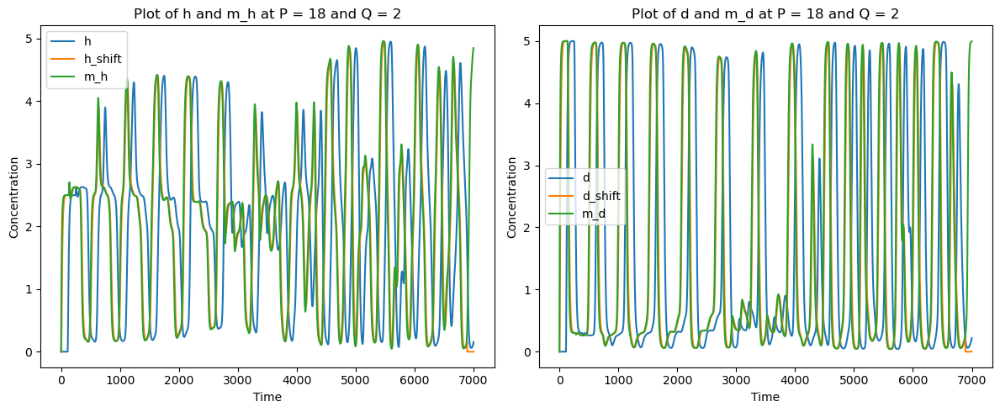

At lattice coordinate P = 19 tau_p: 11.5 that is  115 steps


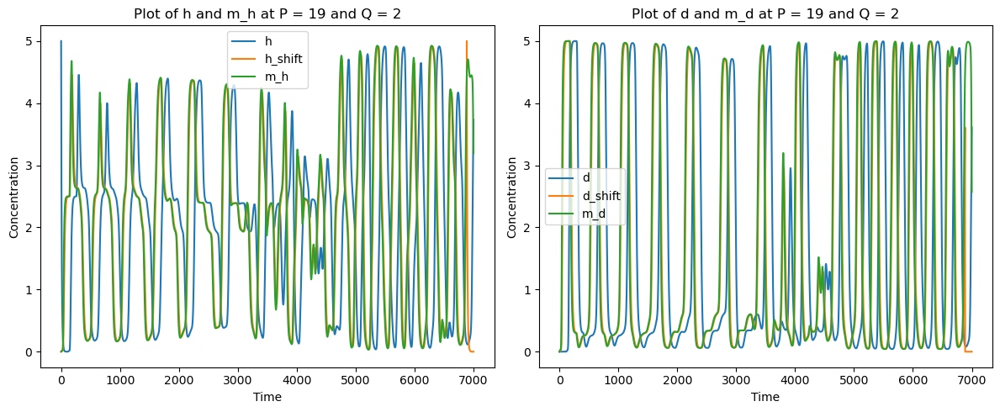

At lattice coordinate P = 20 tau_p: 12.0 that is  120 steps


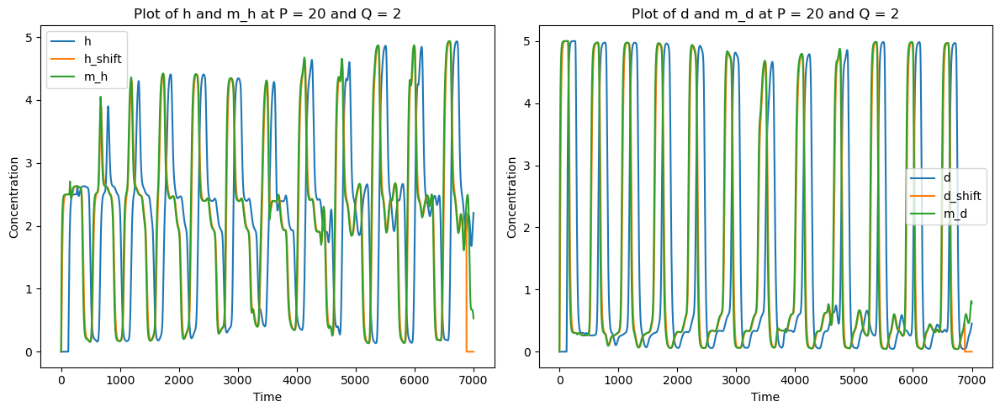

At lattice coordinate P = 21 tau_p: 12.5 that is  125 steps


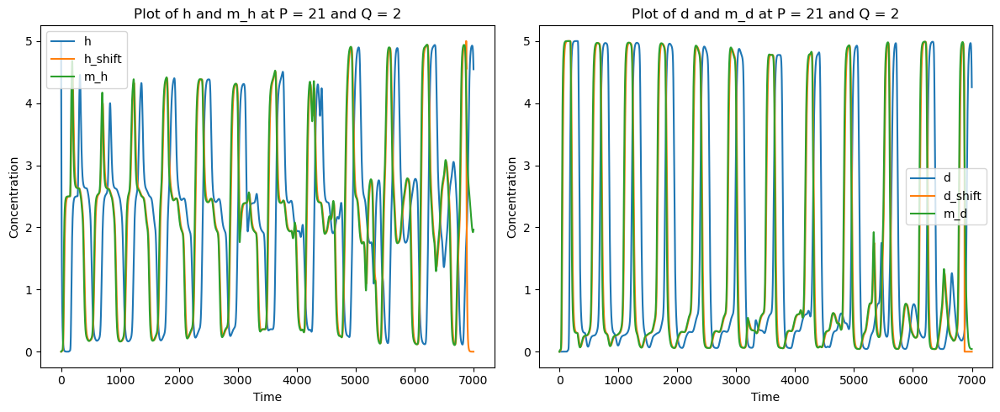

At lattice coordinate P = 22 tau_p: 13.0 that is  130 steps


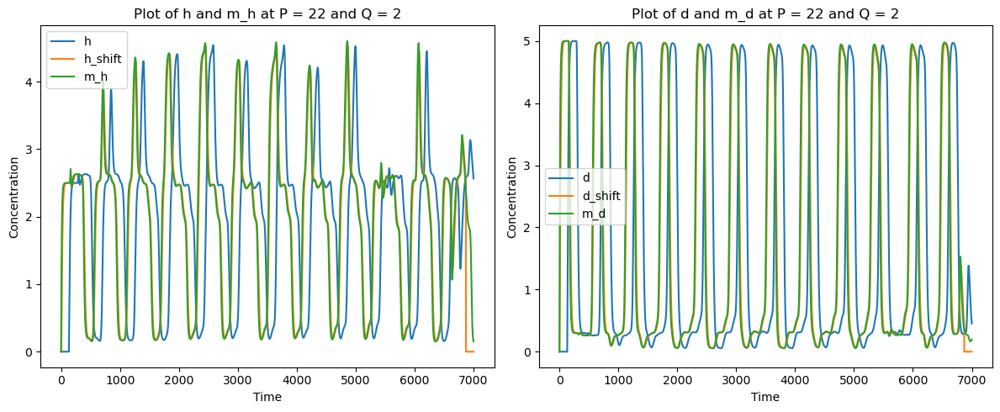

At lattice coordinate P = 23 tau_p: 13.5 that is  135 steps


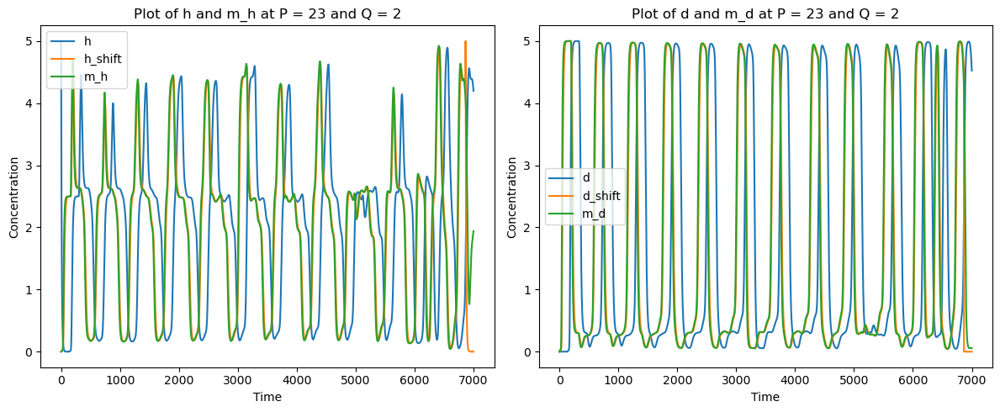

At lattice coordinate P = 24 tau_p: 14.0 that is  140 steps


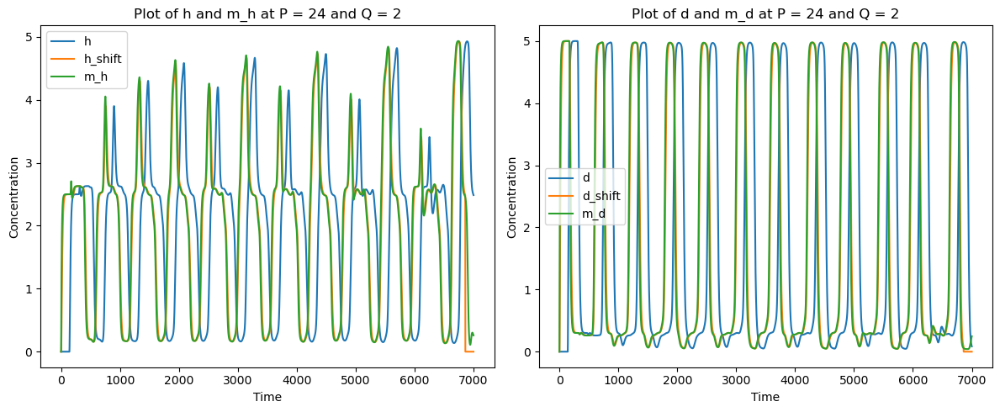

At lattice coordinate P = 25 tau_p: 14.5 that is  145 steps


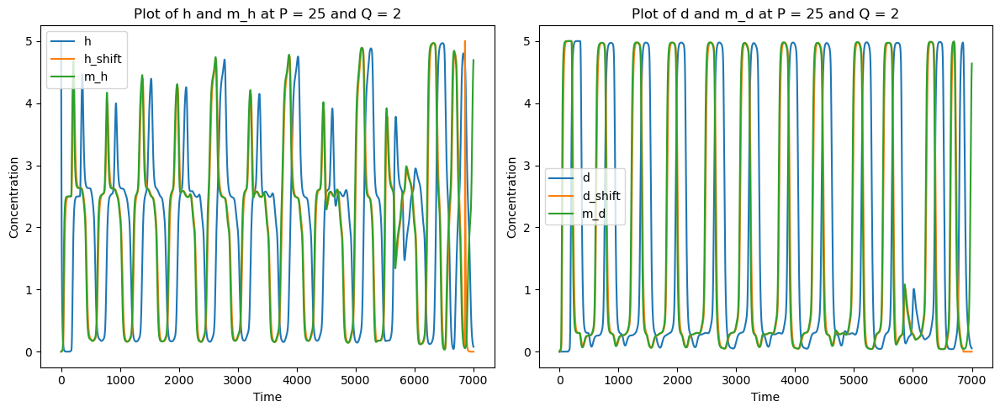

At lattice coordinate P = 26 tau_p: 15.0 that is  150 steps


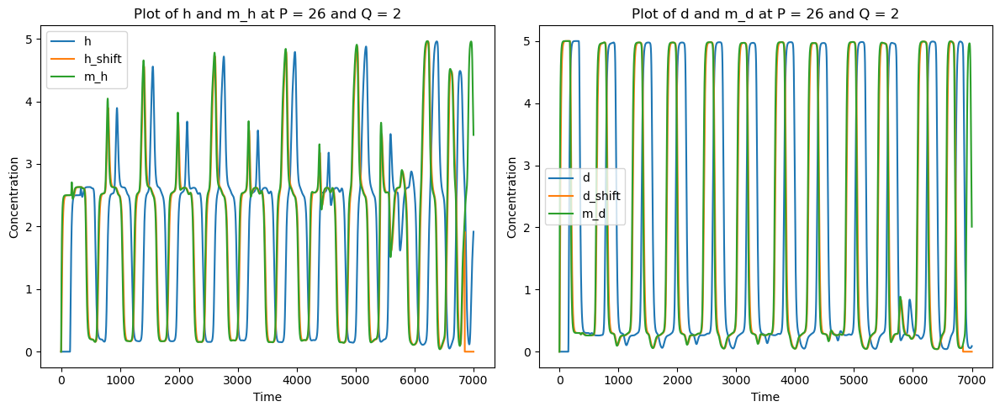

At lattice coordinate P = 27 tau_p: 15.5 that is  155 steps


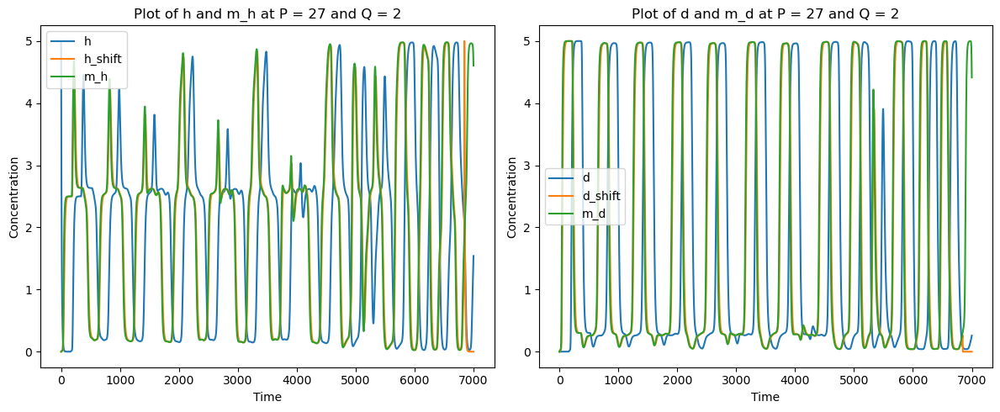

At lattice coordinate P = 28 tau_p: 16.0 that is  160 steps


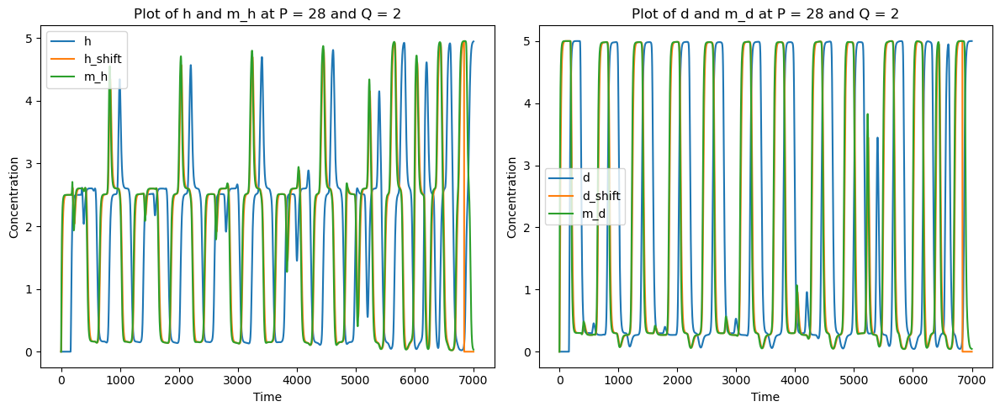

At lattice coordinate P = 29 tau_p: 16.5 that is  165 steps


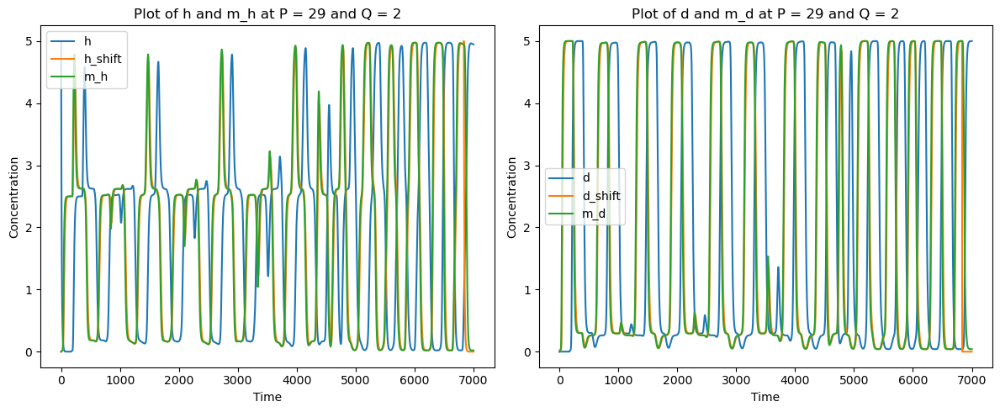

In [36]:
print('Protein delay tau_p:', params.tau_p, 'that is ', params.tau_p_steps, 'steps')

h_shift = np.zeros([num_tsteps, lattice.P, lattice.Q])
d_shift = np.zeros([num_tsteps, lattice.P, lattice.Q])
for i in range(lattice.P):
    print('At lattice coordinate P =', i, 'tau_p:', params.tau_p[i], 'that is ', params.tau_p_steps[i], 'steps')
    h_shift[:,i,:] = np.roll(h[:,i,:], -params.tau_p_steps[i], axis=0)
    d_shift[:,i,:] = np.roll(d[:,i,:], -params.tau_p_steps[i], axis=0)

    test_p = i
    test_q = 2

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Create 1 row, 2 columns of subplots

    # First subplot
    axes[0].plot(h[:, test_p, test_q], label='h')
    axes[0].plot(h_shift[:, test_p, test_q], label='h_shift')
    axes[0].plot(params.alpha_H * m_h[:, test_p, test_q], label='m_h')
    axes[0].set_xlabel('Time')
    axes[0].set_ylabel('Concentration')
    axes[0].legend()
    axes[0].set_title('Plot of h and m_h at P = {} and Q = {}'.format(test_p, test_q))

    # Second subplot
    axes[1].plot(d[:, test_p, test_q], label='d')
    axes[1].plot(d_shift[:, test_p, test_q], label='d_shift')
    axes[1].plot(params.alpha_D * m_d[:, test_p, test_q], label='m_d')
    axes[1].set_xlabel('Time')
    axes[1].set_ylabel('Concentration')
    axes[1].legend()
    axes[1].set_title('Plot of d and m_d at P = {} and Q = {}'.format(test_p, test_q))

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


### Animation of 2D

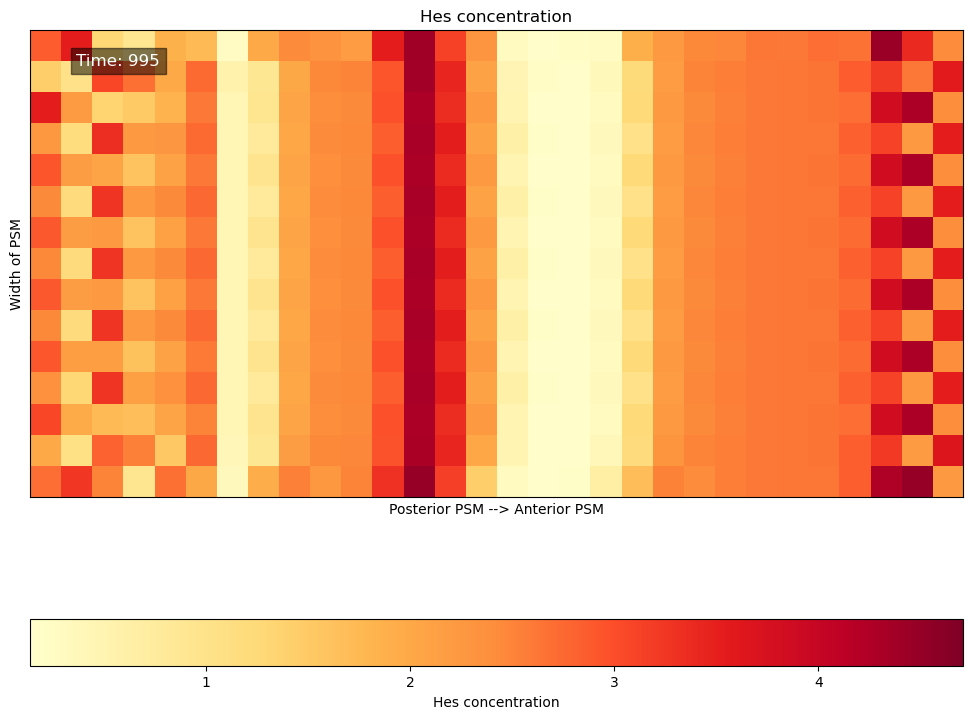

In [31]:
animate_2D(h[800:1000,:,:], interval=5, plot_save=False, filename='2D_travelling_wave.gif', title = 'Hes concentration')

## Get observables from the system

In [5]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def get_roughness(data):
    """ Calculates the arithmetic roughness of the data for a specific slice along the width of the PSM."""

    mean_data = np.mean(data)
    deviations = data - mean_data
    roughness = np.mean(np.abs(deviations))

    return roughness

def generate_color_spectrum(P, cmap_name='viridis'):
    """
    Generate a spectrum of P colors from a given colormap.
    
    Parameters:
        P (int): Number of points/colors needed.
        cmap_name (str): Name of the matplotlib colormap (default: 'viridis').

    Returns:
        List of RGB color values.
    """
    cmap = plt.get_cmap(cmap_name)
    colors = [cmap(i / (P - 1)) for i in range(P)]
    return colors

# Example usage
colors = generate_color_spectrum(lattice.P, cmap_name='plasma')

def windowed_average(data, window_size):
    """
    Calculate the windowed average of data using a moving window of specified size.
    
    Parameters:
        data (ndarray): 2D array of data to be averaged.
        window_size (int): Size of the moving window.
    
    Returns:
        Averaged data array.
    """
    data = data.reshape(-1, data.shape[-1])
    
    data_avg = np.zeros_like(data)
    for i in range(data.shape[0]):
        data_avg[i] = np.convolve(data[i], np.ones(window_size), mode='same') / window_size
    return data_avg

roughness_parameters = np.zeros((h.shape[0], h.shape[1]))

for i in range(h.shape[0]):
    for j in range(h.shape[1]):
        roughness_parameters[i,j] = get_roughness(h[i,j,:])

# for j in range(h.shape[1]):    
#     roughness_parameters[:,j] = windowed_average(roughness_parameters[:,j], 500)   

print(roughness_parameters)




[[2.48888889 2.48888889 2.48888889 ... 2.48888889 2.48888889 2.48888889]
 [2.24       2.24       2.24       ... 2.24       2.24       2.24      ]
 [2.016      2.016      2.016      ... 2.016      2.016      2.016     ]
 ...
 [1.26117811 0.90630915 0.45483167 ... 0.28815847 2.22574972 2.4001712 ]
 [1.21583823 0.94410328 0.47035502 ... 0.27695058 2.22036149 2.39444561]
 [1.16710139 0.97932204 0.48511284 ... 0.26622198 2.21433273 2.38796258]]


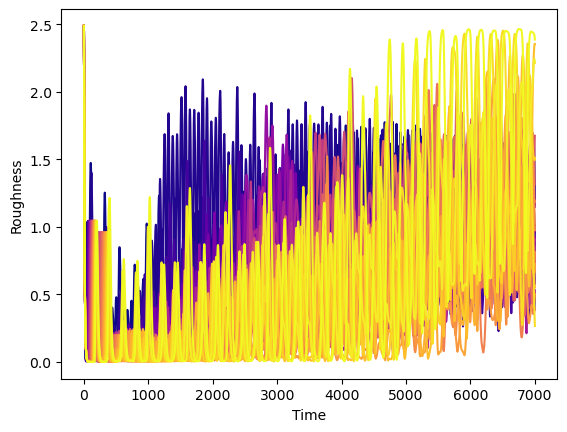

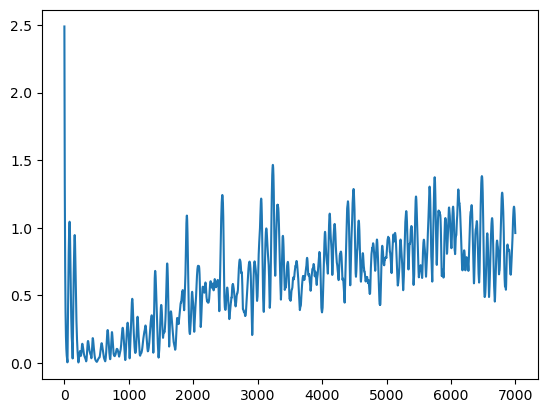

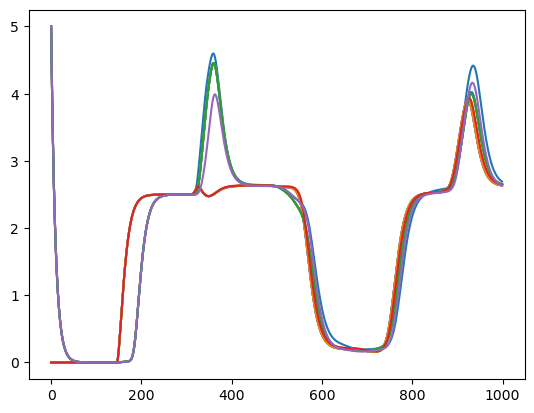

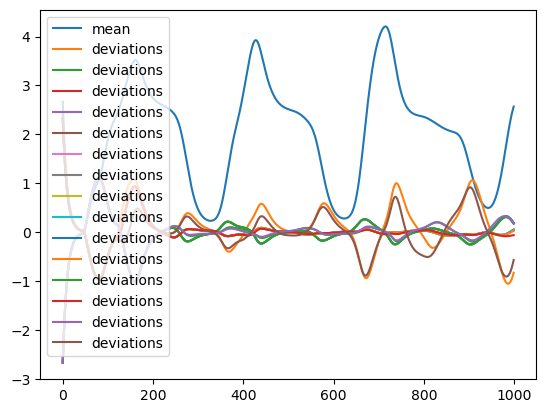

In [6]:
plt.figure()
for i in range(h.shape[1]):
    plt.plot(roughness_parameters[:,i], color=colors[i])
plt.xlabel('Time')
plt.ylabel('Roughness')
plt.show()

plt.figure()
plt.plot(roughness_parameters[:,5])

mean_test = np.mean(h[:,5,:],axis=1)

deviation_test = np.zeros((num_tsteps,15))
for i in range(num_tsteps):
    deviation_test[i,:] = h[i,5,:] - mean_test[i]
    #deviation_test[i,:] = np.abs(deviation_test[i,:])
    # deviation_test[i,:] = 

plt.figure()
plt.plot(h[:1000,25,:])
plt.show()

plt.figure()
plt.plot(mean_test[:1000], label = 'mean')
for j in range(15):
    plt.plot(deviation_test[:1000,j], label='deviations')
plt.legend()

## Results 1D

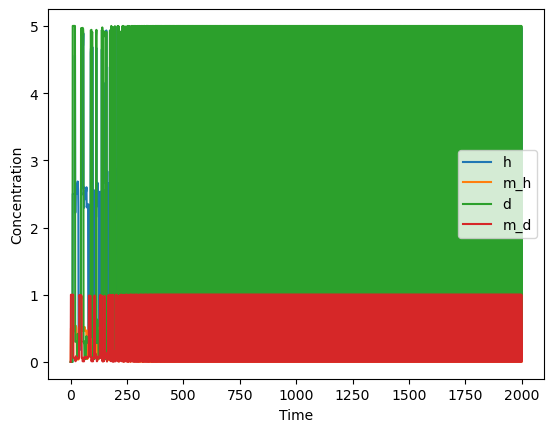

ValueError: cannot reshape array of size 200000 into shape (2000,20)

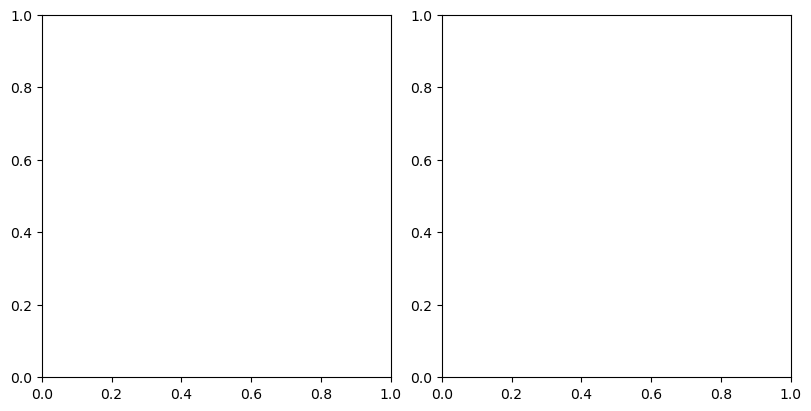

In [10]:
plt.figure()
plt.plot(h[:,10,0], label = 'h')
plt.plot(m_h[:,10,0], label = 'm_h')
plt.plot(d[:,10,0], label = 'd')
plt.plot(m_d[:,10,0], label = 'm_d')
plt.xlabel('Time')
plt.ylabel('Concentration')
plt.legend()
plt.show()

# Set up the figure and two axes for vertically stacked images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4), constrained_layout=True)
h_flat = h.reshape(num_tsteps, lattice.P)
d_flat = d.reshape(num_tsteps, lattice.P)
print(h_flat.shape)

# Plot the first image
im1 = ax1.imshow(h_flat, aspect = 'auto',  cmap='YlOrRd', vmin = np.min(h), vmax = np.ceil(np.max(h)))
ax1.set_ylabel('Time')
ax1.set_xlabel('Cells')
ax1.set_title('Hes values')

# Add colorbar for the first image
cbar1 = fig.colorbar(im1, ax=ax1, orientation='vertical', fraction=0.1, pad=0.2)
cbar1.set_label('Hes values')

# Plot the second image
im2 = ax2.imshow(d_flat, aspect = 'auto',  cmap='YlOrRd', vmin = np.min(d), vmax = np.ceil(np.max(d)))
ax2.set_title('Delta values')

# Add colorbar for the second image
cbar2 = fig.colorbar(im2, ax=ax2, orientation='vertical', fraction=0.1, pad=0.2)
cbar2.set_label('Delta values')

In [ ]:
# def get_delayed_value(values_array, current_index, delay_steps, lattice, params):
#     """Retrieves the value from a past step in the simulation."""

#     values_delayed = values_array.copy()

#     if params.tau_grad:
#         for p in range(lattice.P):
#           #  values_p = values_array[:, p, :] 
#             delayed_index = max(0, current_index - delay_steps[p])
#             print('current index is', current_index, 'at p = ', p, 'with a delay of', delay_steps[p], 'gives delayed index', delayed_index)
#             values_delayed[current_index, p, :] = values_array[delayed_index, p, :]
    
#     else:
#         delayed_index = max(0, current_index - delay_steps)
#         values_delayed[current_index] = values_array[delayed_index]

#     return values_delayed

# params_test = params 
# lattice_test = lattice
# lattice_test.P = 3

# test_matrix = np.random.rand(10, 3, 1)
# test_delays = np.array([3,3,3])

# for i in range(10):
#     delayed_test_matrix = get_delayed_value(test_matrix, i, test_delays, lattice_test, params)

#     # small fluctuation added to the test matrix
#     test_matrix[i] = test_matrix[i] + np.ones([3,1])

#     #print the values of the test matrix and the delayed test matrix
#     print(test_matrix[i], delayed_test_matrix)
